In [25]:
import random
import math
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from sklearn.manifold import TSNE
from src.scripts.category_analysis import *
from src.scripts.clustering import *
import plotly.express as px

In [26]:
adapted_movies_df = pd.read_csv('data/adapted_movies.csv')
_, adapted_movies_df = analysis_by_category(adapted_movies_df)
adapted_movies_genres = pd.Series(adapted_movies_df.groupby('wikipedia_id')['category'].apply(lambda x: list(x)).reset_index(drop=True))

In [27]:
all_movies_df = pd.read_csv('data/all_movies.csv')
_, all_movies_df = analysis_by_category(all_movies_df)
all_movies_genres = pd.Series(all_movies_df.groupby('wikipedia_id')['category'].apply(lambda x: list(x)).reset_index(drop=True))

In [28]:
df_genre_adapted, adapted_movies_df = get_dummy(adapted_movies_df)
df_genre_all, all_movies_df = get_dummy(all_movies_df)

### clustering on adapted movies

In [ ]:
df = df_genre_adapted.drop(columns=['wikipedia_id' ])
X_reduced_tsne = TSNE(n_components=2, init='random', learning_rate='auto', random_state=0).fit_transform(df)
sse = plot_sse(X_reduced_tsne, start=2, end=50, title = 'Elbow plot for adapted movies')

In [21]:
labels = pd.Series(KMeans(n_clusters=11, random_state=13).fit_predict(X_reduced_tsne))

title = 'KMeans Clustering on t-SNE Reduced Data of Adapted Movies'

data = {
    'Dimension 1': X_reduced_tsne[:, 0],
    'Dimension 2': X_reduced_tsne[:, 1],
    'Label': labels,
    'MovieName': adapted_movies_df['MovieName'],
    'Genre': adapted_movies_genres,
}
df = pd.DataFrame(data)

plot_clustering(df, title, name = 'adapted_movies_cluster')

In [7]:
labels = pd.Series(labels, name='Cluster')
genres = pd.Series(adapted_movies_genres, name='Genres')
df = pd.concat([adapted_movies_df, labels, genres], axis = 1)
name = "adapted_movies_cluster_stats"
cluster_analysis = analysis_by_cluster(df, name)
cluster_analysis

,Average Box Office,Average Rating,Box Office Variance,Rating Variance,GenresList,ClusterSize
Cluster,,,,,,
0,8.032296e+07,6.416033,1.508091e+08,0.951029,"[Action & Adventure, Classic & Silent, Fantasy...",368
1,8.804673e+07,6.443028,1.281235e+08,0.922768,"[Drama, Classic & Silent, Historical & Period,...",251
2,8.111918e+07,6.489524,1.417135e+08,0.922336,"[Drama, Action & Adventure, Family & Children,...",210
3,8.151472e+07,6.467203,1.434108e+08,0.969246,"[Action & Adventure, Thrillers & Mysteries, Dr...",311
4,7.689315e+07,6.489456,1.563642e+08,0.940694,"[Horror & Supernatural, Thrillers & Mysteries,...",294
5,7.157687e+07,6.437710,1.341255e+08,0.940525,"[Thrillers & Mysteries, Crime & Gangster, Dram...",297
6,7.467272e+07,6.408000,1.334570e+08,1.020462,"[Drama, Action & Adventure, Historical & Perio...",200
7,7.045260e+07,6.469079,1.491234e+08,0.926381,"[Family & Children, Comedy, Action & Adventure...",304
8,1.050582e+08,6.440698,1.860926e+08,0.959273,"[Drama, Historical & Period, Romance & Relatio...",172


### clustering on all movies

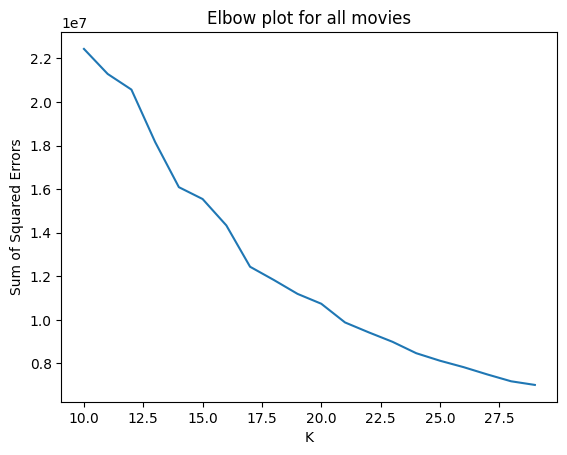

In [ ]:
df = df_genre_all.drop(columns=['wikipedia_id'])
X_reduced_tsne = TSNE(n_components=2, init='random', learning_rate='auto', random_state=0).fit_transform(df)
sse = plot_sse(X_reduced_tsne, start=10, end=30, title = 'Elbow plot for all movies')

In [ ]:
labels = pd.Series(KMeans(n_clusters=16, random_state=13).fit_predict(X_reduced_tsne))

title = 'KMeans Clustering on t-SNE Reduced Data of All Movies'

data = {
    'Dimension 1': X_reduced_tsne[:, 0],
    'Dimension 2': X_reduced_tsne[:, 1],
    'Label': labels,
    'MovieName': all_movies_df['MovieName'],
    'Genre': all_movies_genres,
}
df = pd.DataFrame(data)

plot_clustering(df, title, name = 'all_movies_cluster')